<a href="https://colab.research.google.com/github/biniiiii/AI-Human_TextDetection/blob/main/opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [127]:
import cv2

In [184]:
uploaded = files.upload()
img = cv2.imread(list(uploaded.keys())[0])

Saving yup.jpg to yup.jpg


In [180]:
# resize once, right after loading
scale = 0.9
width = int(img.shape[1] * scale)
height = int(img.shape[0] * scale)
img = cv2.resize(img, (width, height))

In [181]:
print(img.shape) #height weight in pixels and no of channels

(11, 8, 3)


In [182]:
cv2.imwrite('output.jpg', img)

True

In [183]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

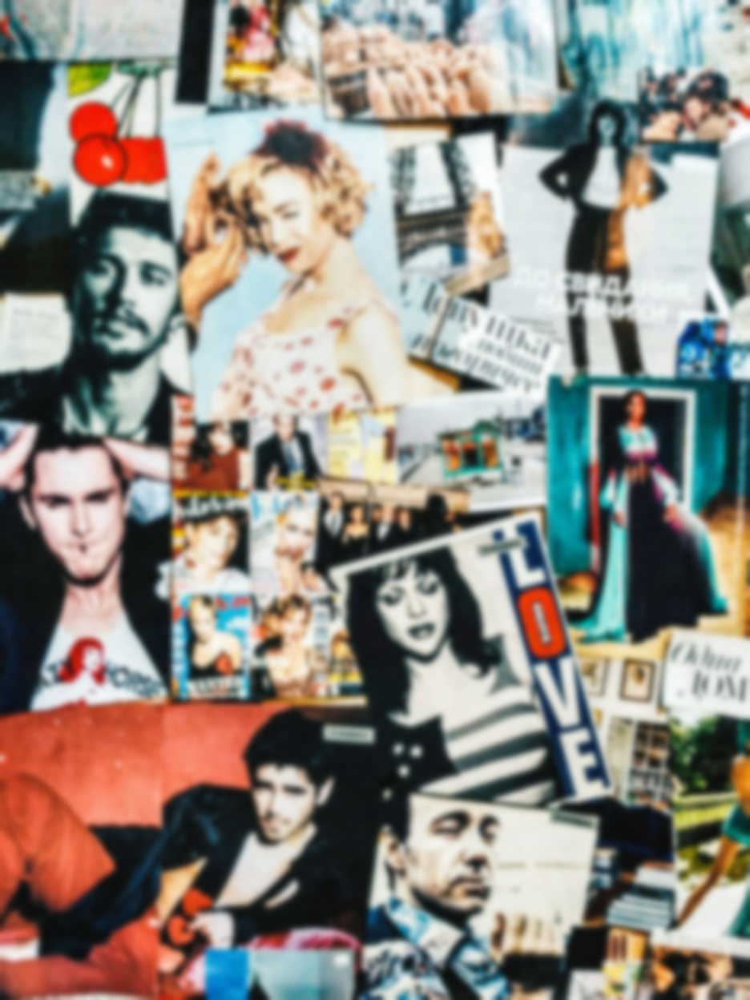

In [149]:
blurred_img = cv2.GaussianBlur(img, (21, 21), 0) # Apply Gaussian blur with a 21x21 kernel
cv2_imshow(blurred_img)

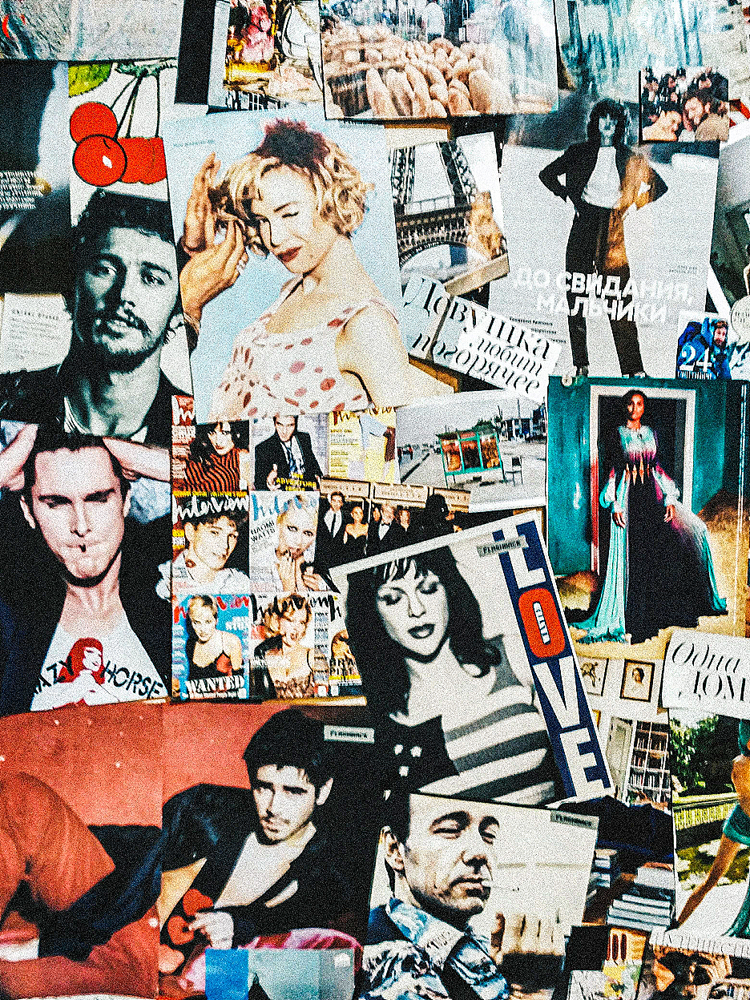

In [150]:
import numpy as np

# Define a sharpening kernel
sharpening_kernel = np.array([[0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]])

# Apply the sharpening filter to the original image
sharpened_img = cv2.filter2D(img, -1, sharpening_kernel)

cv2_imshow(sharpened_img)

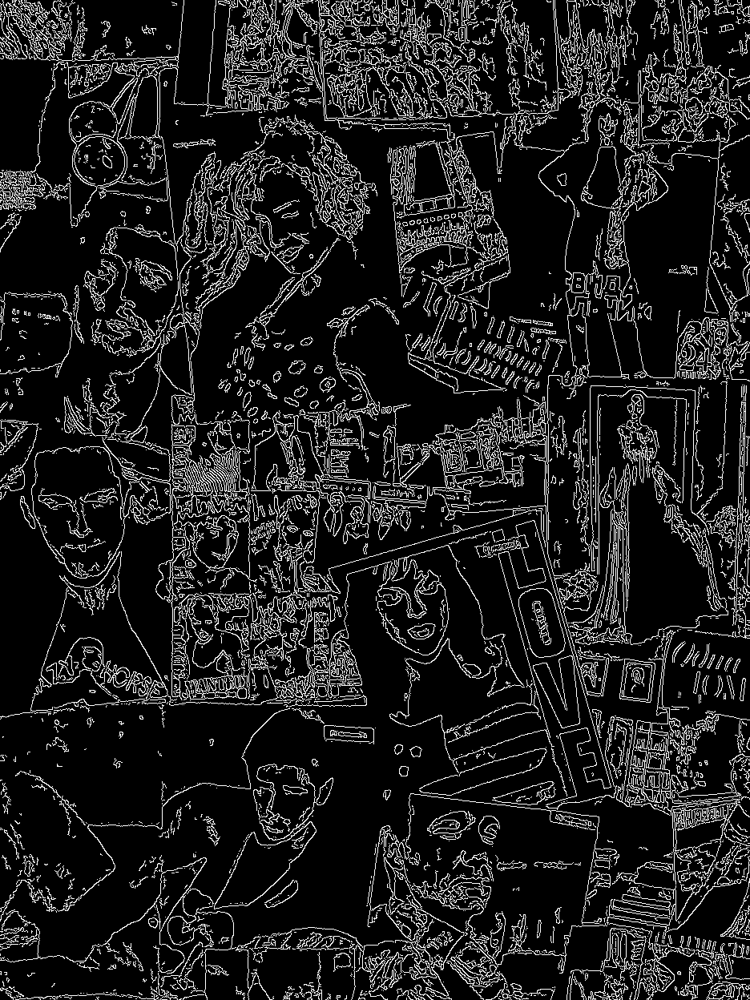

In [151]:
edges = cv2.Canny(img, 100, 200)
cv2_imshow(edges)

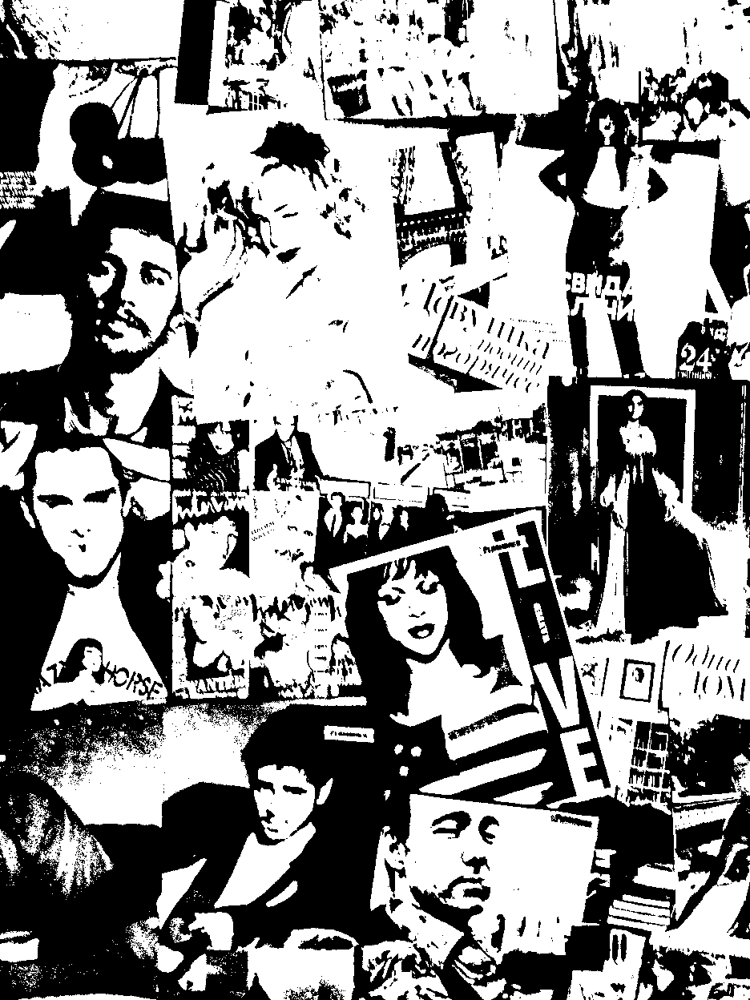

In [152]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh)

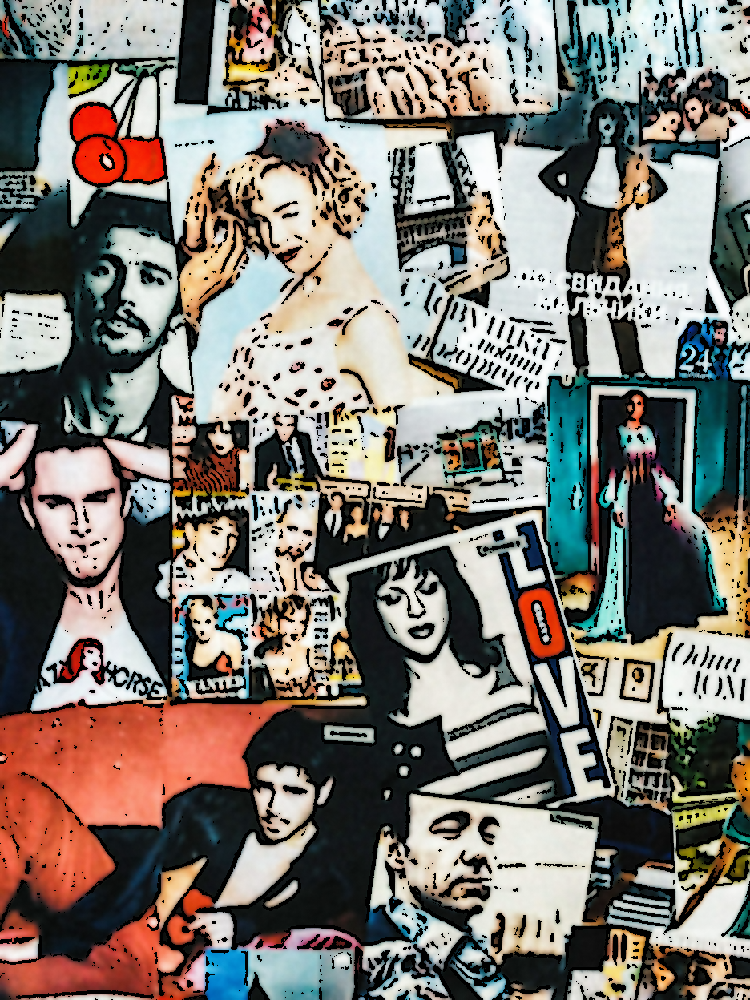

In [153]:
#cartoon effect
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray_blur = cv2.medianBlur(gray, 5)
edges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
color = cv2.bilateralFilter(img, 9, 300, 300)
cartoon = cv2.bitwise_and(color, color, mask=edges)
cv2_imshow(cartoon)

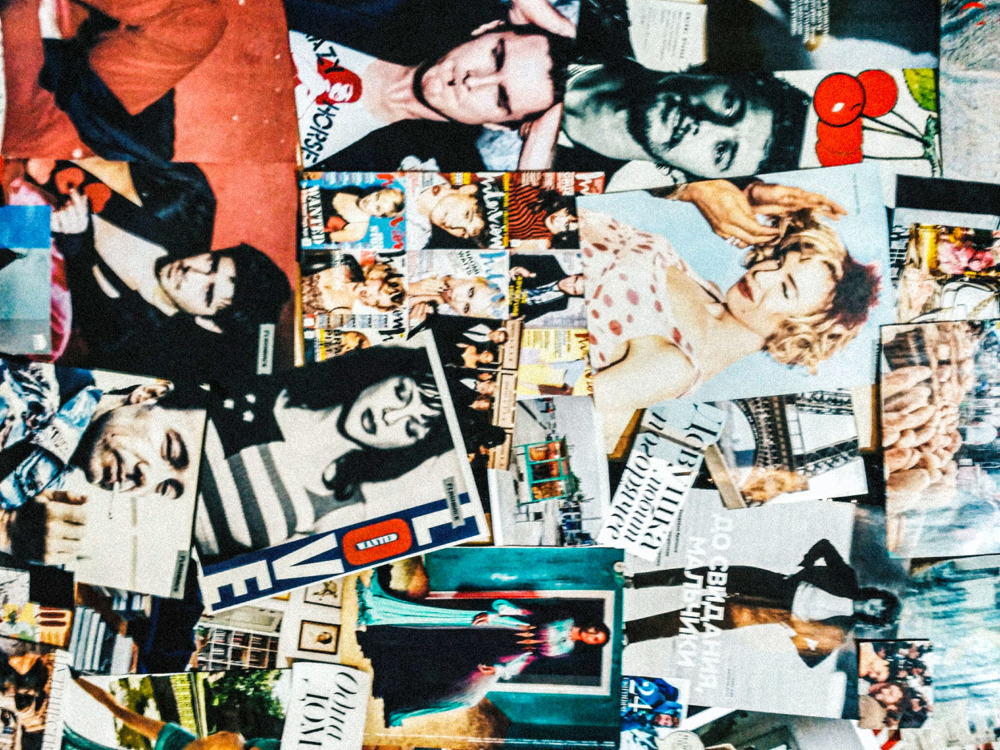

In [154]:
rotated = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
flipped = cv2.flip(img, 1)
cv2_imshow(rotated)


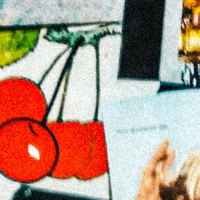

In [155]:
resized = cv2.resize(img, (300, 300))
cropped = img[50:250, 100:300]
cv2_imshow(cropped)

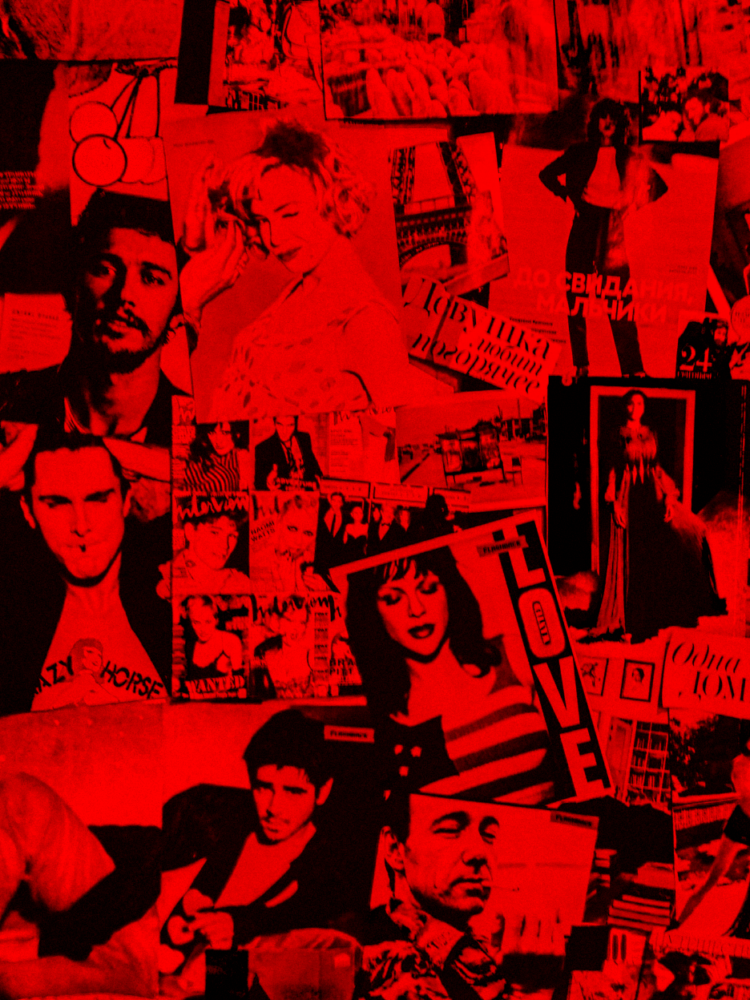

In [156]:
b, g, r = cv2.split(img)
zeros = b*0
red_only = cv2.merge([zeros, zeros, r])
cv2_imshow(red_only)

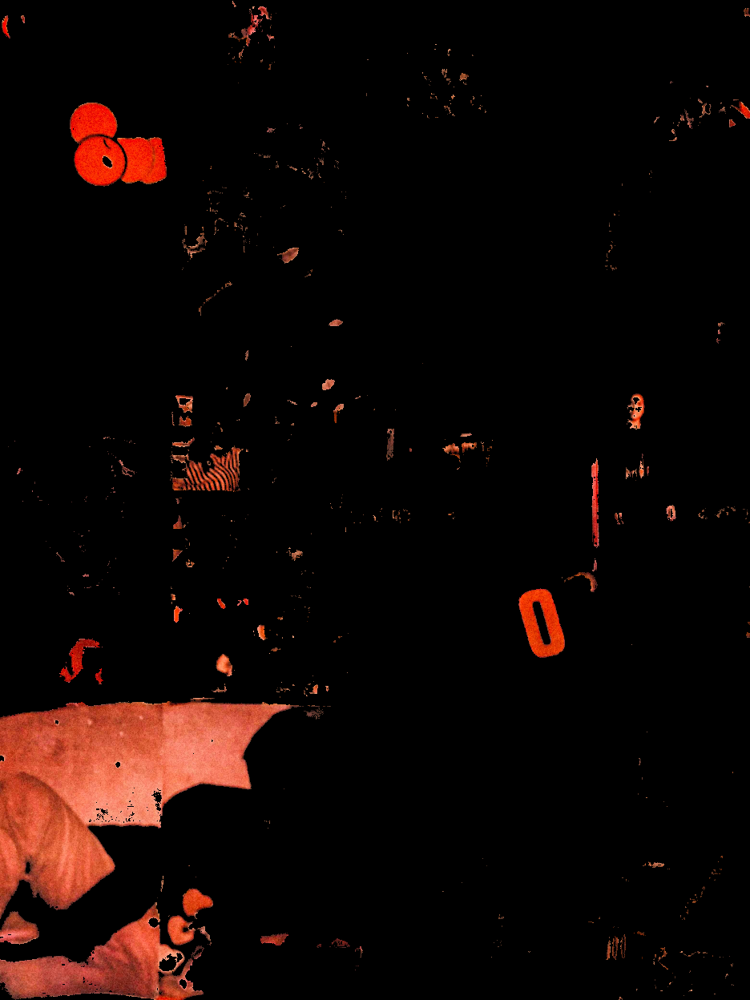

In [157]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lower = (0, 120, 70)
upper = (10, 255, 255)
mask = cv2.inRange(hsv, lower, upper)
result = cv2.bitwise_and(img, img, mask=mask)
cv2_imshow(result)

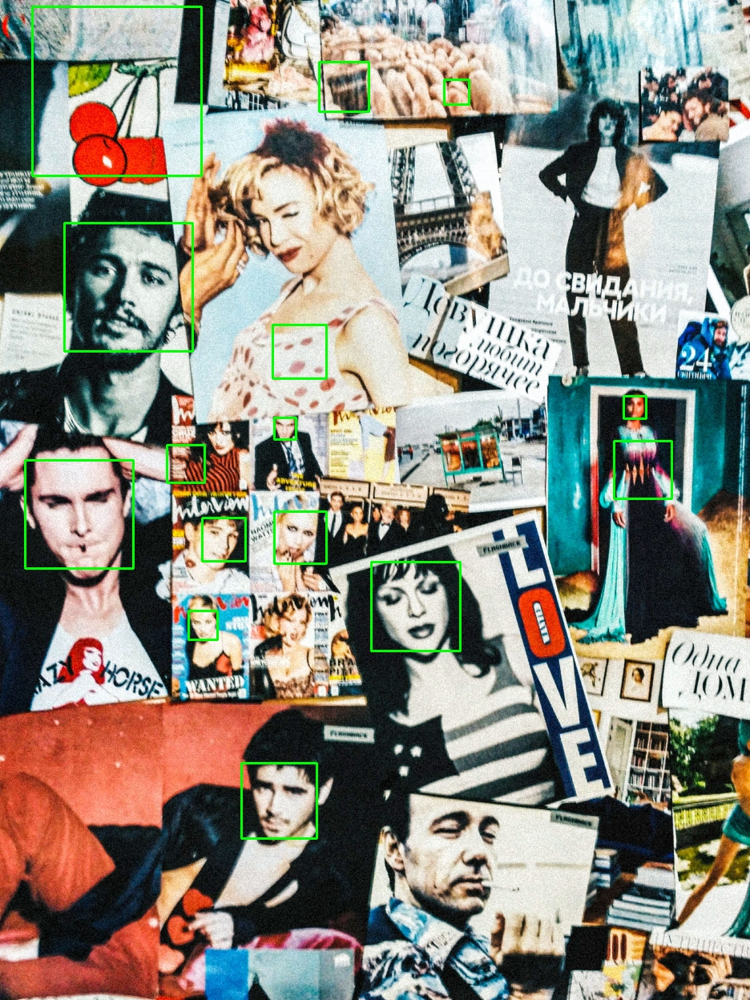

In [158]:
#Haar cascade pre-trained classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.1, 4)

for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
cv2_imshow(img)